In [3]:
import pandas as pd
import plotly.express as px

In [4]:
root = "C:/Users/uvm88/Desktop/Entregables/DATOS LIMPIOS 2013-2023/DEFUNCIONES/CANCER/"
years = ["2013", "2014", "2015", "2016", "2017", "2018", "2019", "2020", "2021", "2022", "2023"]

df_defunciones_cancer = []

for year in years:
    df_base = pd.read_csv(root + "DEFUNCANCER" + year + ".csv")
    df_base.insert(0, "año", year)
    df_defunciones_cancer.append(df_base)
df_concat = pd.concat(df_defunciones_cancer)

In [5]:
df_concat = df_concat.reset_index().drop("index", axis = 1)
df_concat

,año,sexo,edad_agrupada,edad,causa_defuncion,capitulo,grupo,entidad_ocurrencia,municipio_ocurencia,area_ur,entidad_residencia,municipio_residencia,escolaridad,derechohabientes,edad_anios,asistencia_medica,municipio_ocurrencia
0,2013,1,18,66.0,C329,2,3,1,1.0,2,1,1,1,7,66.0,NaN,NaN
1,2013,1,18,66.0,C259,2,2,1,1.0,2,1,1,4,7,66.0,NaN,NaN
2,2013,2,20,77.0,C349,2,3,1,1.0,1,1,1,9,3,77.0,NaN,NaN
3,2013,1,18,67.0,C169,2,2,1,1.0,1,1,1,6,2,67.0,NaN,NaN
4,2013,2,14,45.0,C349,2,3,1,1.0,1,1,1,9,1,45.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
934545,2023,2,19,73.0,C169,2,2,32,48.0,2,32,48,6,1,73.0,1.0,NaN
934546,2023,1,19,72.0,C241,2,2,32,56.0,1,32,56,3,1,72.0,1.0,NaN
934547,2023,1,17,62.0,C61X,2,9,32,49.0,2,32,49,3,99,62.0,1.0,NaN
934548,2023,2,22,87.0,C259,2,2,32,24.0,2,32,24,1,99,87.0,1.0,NaN


In [9]:
df_lineplot = df_concat["año"].value_counts().reset_index()
df_lineplot.columns = ["año", "cantidad"]
df_lineplot = df_lineplot.sort_values("año", ignore_index = True)

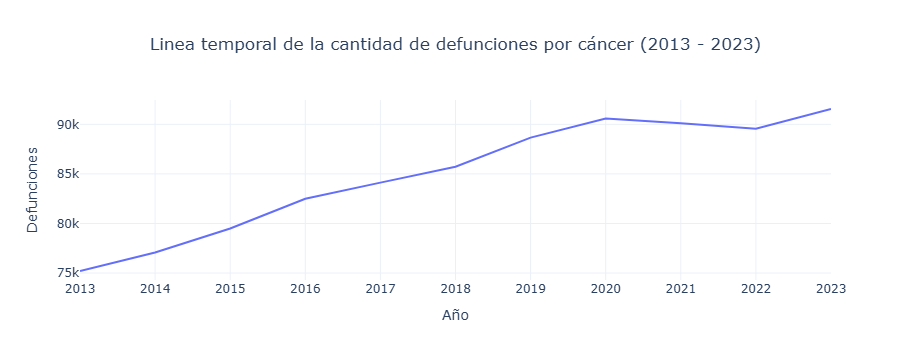

In [10]:
fig_line = px.line(df_lineplot,
              x='año',
              y='cantidad',
              title='Linea temporal de la cantidad de defunciones por cáncer (2013 - 2023)',
              template='plotly_white')


fig_line.update_layout(
    xaxis_title='Año',
    yaxis_title='Defunciones',
    title_x=0.5 
)
fig_line.write_html("linea_temporal_defunciones_cancer.html")
fig_line.show()

In [4]:
df_concat.value_counts("causa_defuncion")
df_concat = df_concat[df_concat["causa_defuncion"].isin(["C509", "C61X", "C349", "C169", "C189"])]
df_agrupado = df_concat["causa_defuncion"].value_counts().reset_index()
df_agrupado.columns = ["Enfermedad", "Cantidad"]

mapeo = {
    "C509":"Cáncer de mama",
    "C61X":"Cáncer de próstata",
    "C349":"Cáncer de pulmón o bronquios",
    "C169":"Cáncer de estómago",
    "C189":"Cáncer de colon"
}
df_agrupado["Enfermedad"] = df_agrupado["Enfermedad"].replace(mapeo)
df_agrupado

,Enfermedad,Cantidad
0,Cáncer de mama,77884
1,Cáncer de próstata,76547
2,Cáncer de pulmón o bronquios,72514
3,Cáncer de estómago,65914
4,Cáncer de colon,56044


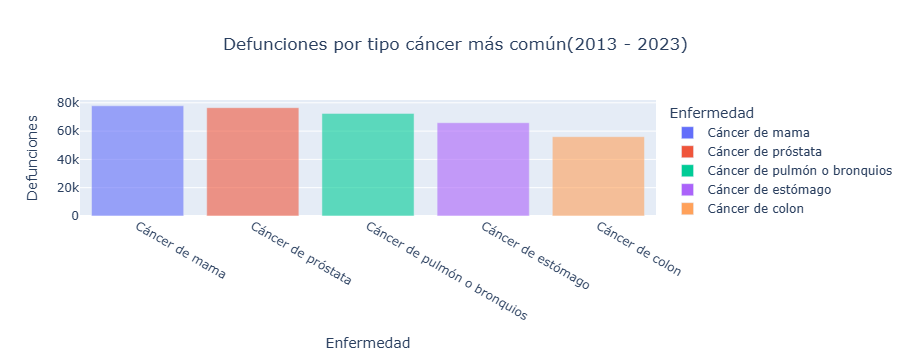

In [6]:
fig_bar = px.bar(
    df_agrupado,
    x = "Enfermedad",
    y = "Cantidad",
    color = "Enfermedad",
    title = "Defunciones por tipo cáncer más común(2013 - 2023)",
    opacity=0.6
)

fig_bar.update_layout(
    xaxis_title = "Enfermedad",
    yaxis_title = "Defunciones",
    title_x = 0.5
)

fig_bar.show()
fig_bar.write_html("defunciones_canceres_mas_comunes.html")

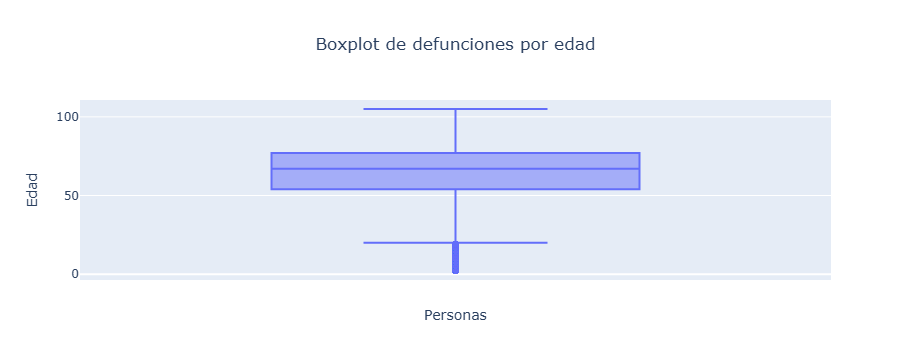

In [62]:
df_concat = df_concat[(df_concat["edad"] < 112) & (df_concat["edad"] > 1)]

plotbox_m = px.box(
    df_concat,
    y = "edad",
    title = "Boxplot de defunciones por edad",
)

plotbox_m.update_layout(
    xaxis_title = "Personas",
    yaxis_title = "Edad",
    title_x = 0.5
)

plotbox_m.show()
plotbox_m.write_html("boxplot_defunciones_por_edad.html")

In [55]:
df_concat

,año,sexo,edad_agrupada,edad,causa_defuncion,capitulo,grupo,entidad_ocurrencia,municipio_ocurencia,area_ur,entidad_residencia,municipio_residencia,escolaridad,derechohabientes,edad_anios,asistencia_medica,municipio_ocurrencia
0,2013,1,18,66.0,C329,2,3,1,1.0,2,1,1,1,7,66.0,NaN,NaN
1,2013,1,18,66.0,C259,2,2,1,1.0,2,1,1,4,7,66.0,NaN,NaN
2,2013,2,20,77.0,C349,2,3,1,1.0,1,1,1,9,3,77.0,NaN,NaN
3,2013,1,18,67.0,C169,2,2,1,1.0,1,1,1,6,2,67.0,NaN,NaN
4,2013,2,14,45.0,C349,2,3,1,1.0,1,1,1,9,1,45.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
934545,2023,2,19,73.0,C169,2,2,32,48.0,2,32,48,6,1,73.0,1.0,NaN
934546,2023,1,19,72.0,C241,2,2,32,56.0,1,32,56,3,1,72.0,1.0,NaN
934547,2023,1,17,62.0,C61X,2,9,32,49.0,2,32,49,3,99,62.0,1.0,NaN
934548,2023,2,22,87.0,C259,2,2,32,24.0,2,32,24,1,99,87.0,1.0,NaN


In [46]:
df_agrupado = df_concat.groupby("sexo").size().reset_index(name="Cantidad")
mapeo = {
    1:"Hombres",
    2:"Mujeres",
}
df_agrupado["sexo"] = df_agrupado["sexo"].replace(mapeo)
df_agrupado = df_agrupado.drop(2, axis = 0)
df_agrupado

,sexo,Cantidad
0,Hombres,454299
1,Mujeres,480236


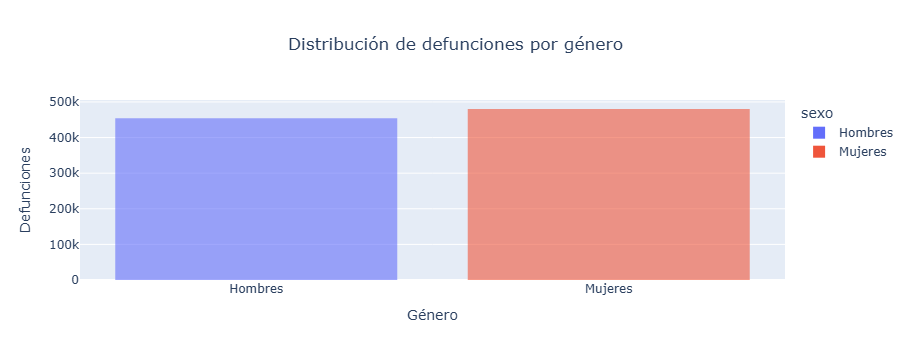

In [52]:
fig_defun = px.histogram(
    df_agrupado,
    x = "sexo",
    y = "Cantidad",
    color = "sexo",
    nbins = 2,
    barmode = "overlay",
    opacity = 0.6,
    title = "Distribución de defunciones por género"
)

fig_defun.update_layout(
    xaxis_title="Género",
    yaxis_title="Defunciones",
    title_x=0.5
)

fig_defun.show()
fig_defun.write_html("distribucion_defunciones_cancer_genero.html")

In [72]:
df_agrupado = df_concat.groupby("derechohabientes").size().reset_index(name="Personas")

mapeo = {
    1:"Ninguna",
    2:"IMSS",
    3:"ISSSTE",
    4:"PEMEX",
    5:"SEDENA",
    6:"SEMAR",
    7:"Seguro Popular",
    8:"Otra",
    9:"IMSS PROSPERA",
    10:"ISSFAM",
    99:"N/E"
}
df_agrupado["derechohabientes"] = df_agrupado["derechohabientes"].replace(mapeo)

df_agrupado

,derechohabientes,Personas
0,Ninguna,163170
1,IMSS,389668
2,ISSSTE,87262
3,PEMEX,10588
4,SEDENA,6818
5,SEMAR,2183
6,Seguro Popular,152581
7,Otra,27858
8,IMSS PROSPERA,4037
9,ISSFAM,763


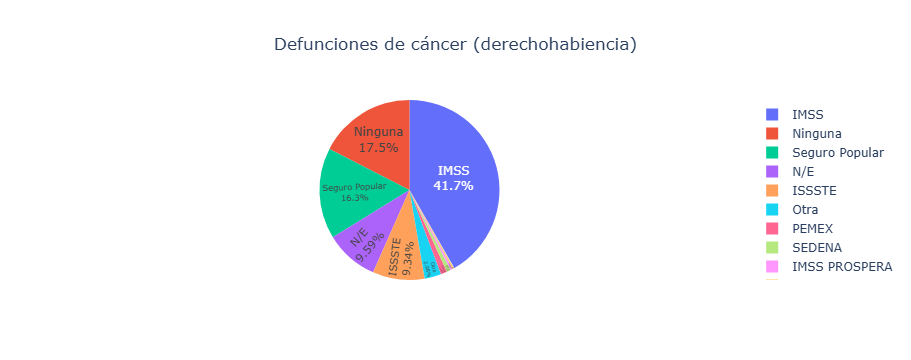

In [75]:
piechart = px.pie(
    df_agrupado,
    names = "derechohabientes",
    values = "Personas",
    title = "Defunciones de cáncer (derechohabiencia)"
)

piechart.update_traces(textposition='inside', textinfo='percent+label')
piechart.update_layout(title_x=0.5)

piechart.show()
piechart.write_html("defunciones_cancer_cerechohabiencia.html")

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt

In [6]:
df_concat["geometry"] = None
df_concat
gdf = gpd.GeoDataFrame(df_concat, geometry="geometry")
gdf.set_crs(epsg=4326, inplace=True)
gdf.to_file("archivo_cancer.geojson", driver="GeoJSON")

In [8]:
gdf_def_cancer = gpd.read_file(r"C:\Users\uvm88\Desktop\Entregables\Códigos\defunciones_cancer_diabetes\Códigos\archivo_cancer.geojson")
gdf_def_cancer.head(3)

,año,sexo,edad_agrupada,edad,causa_defuncion,capitulo,grupo,entidad_ocurrencia,municipio_ocurencia,area_ur,entidad_residencia,municipio_residencia,escolaridad,derechohabientes,edad_anios,asistencia_medica,municipio_ocurrencia,geometry
0,2013,1,18,66.0,C329,2,3,1,1.0,2,1,1,1,7,66.0,NaN,NaN,None
1,2013,1,18,66.0,C259,2,2,1,1.0,2,1,1,4,7,66.0,NaN,NaN,None
2,2013,2,20,77.0,C349,2,3,1,1.0,1,1,1,9,3,77.0,NaN,NaN,None


In [9]:
gdf_def_cancer_agg = gdf_def_cancer.groupby(by = "entidad_residencia")["causa_defuncion"].agg(["count"])
gdf_def_cancer_agg = gdf_def_cancer_agg.drop([99, 35, 34, 33], axis = 0)
gdf_def_cancer_agg = gdf_def_cancer_agg.reset_index()

In [10]:
mun = gpd.read_file(r"C:\Users\uvm88\Desktop\Entregables\mg_2024_integrado\conjunto_de_datos\00ent.shp")
mun["CVE_ENT"] = mun["CVE_ENT"].astype(int)
mun.head(3)

,CVEGEO,CVE_ENT,NOMGEO,geometry
0,01,1,Aguascalientes,"POLYGON ((2469550.852 1159302.643, 2469738.209..."
1,02,2,Baja California,"MULTIPOLYGON (((1313480.513 1831458.607, 13135..."
2,03,3,Baja California Sur,"MULTIPOLYGON (((1694656.345 1227647.637, 16946..."


<Axes: >

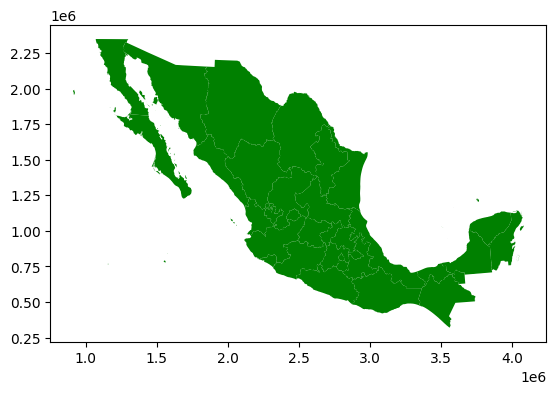

In [11]:
mun.plot(color = "green")

In [12]:
datos_me = mun.merge(gdf_def_cancer_agg, left_on = "CVE_ENT", right_on = "entidad_residencia") 
datos_me

,CVEGEO,CVE_ENT,NOMGEO,geometry,entidad_residencia,count
0,01,1,Aguascalientes,"POLYGON ((2469550.852 1159302.643, 2469738.209...",1,9303
1,02,2,Baja California,"MULTIPOLYGON (((1313480.513 1831458.607, 13135...",2,27013
2,03,3,Baja California Sur,"MULTIPOLYGON (((1694656.345 1227647.637, 16946...",3,5750
3,04,4,Campeche,"MULTIPOLYGON (((3544897.199 946994.621, 354491...",4,6398
4,05,5,Coahuila de Zaragoza,"POLYGON ((2469501.165 1978862.429, 2469539.651...",5,23922
5,06,6,Colima,"MULTIPOLYGON (((1157633.318 768573.525, 115772...",6,6024
6,07,7,Chiapas,"POLYGON ((3558179.782 698365.65, 3558487.689 6...",7,35928
7,08,8,Chihuahua,"POLYGON ((1961978.327 2201082.365, 1961978.967...",8,31825
8,09,9,Ciudad de México,"POLYGON ((2802175.66 843326.718, 2801806.564 8...",9,93297
9,10,10,Durango,"POLYGON ((2107050.444 1641943.398, 2109767.527...",10,12440


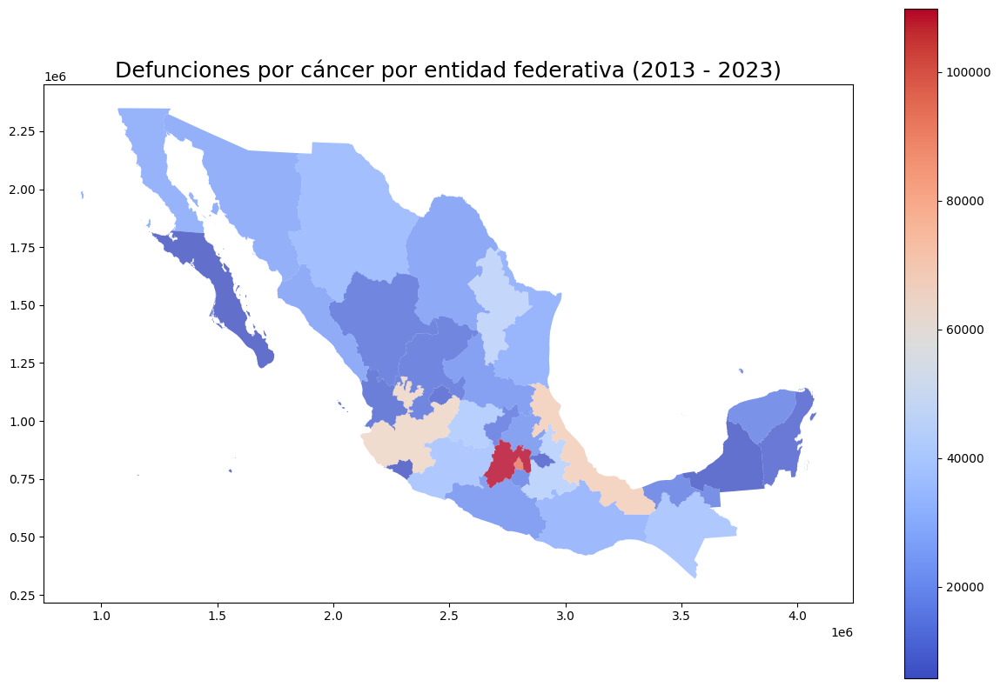

In [15]:
datos_me.plot(legend = True, 
                                 column = "count", 
                                 cmap = "coolwarm", 
                                 alpha = 0.8, 
                                 figsize = (15,10),
                                 )
plt.title("Defunciones por cáncer por entidad federativa (2013 - 2023)", fontsize=18)
plt.savefig("defun_cancer_mapa", dpi=300)
plt.show()

In [14]:
datos_me.describe()

,CVE_ENT,entidad_residencia,count
count,32.000000,32.000000,32.000000
mean,16.500000,16.500000,29106.062500
std,9.380832,9.380832,24652.835547
min,1.000000,1.000000,5750.000000
25%,8.750000,8.750000,12487.250000
50%,16.500000,16.500000,22637.500000
75%,24.250000,24.250000,35879.250000
max,32.000000,32.000000,109857.000000
